# SpatialMouse: Mefisto factorization - Data processed separately for each organ

## Literature/Tutorials:

- Publication: https://www.nature.com/articles/s41592-021-01343-9#data-availability
- Python tutorial: https://github.com/bioFAM/MEFISTO_tutorials/blob/master/MEFISTO_ST.ipynb
- Python tutorial using `muon`: https://muon-tutorials.readthedocs.io/en/latest/mefisto/3-MEFISTO-ST.html
- Website: https://biofam.github.io/MOFA2/MEFISTO.html

## Similar tools:
- https://github.com/willtownes/spatial-factorization-py
- https://github.com/willtownes/nsf-paper

## Library import

In [1]:
## The following code ensures that all functions and init files are reloaded before executions.
%load_ext autoreload
%autoreload 2

In [2]:
#HOME = "/home/hpc/johannes.wirth/"
HOME = "/home/jwirth/"

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import scanpy as sc
import pandas as pd
import anndata
import seaborn as sns
from tqdm import tqdm
from glob import glob
import squidpy as sq
import gc

## Import the custom library
import os
import sys
#module_path = os.path.abspath(os.path.join(HOME, 'projects/DbitX_toolbox/'))
module_path = os.path.abspath(os.path.join(HOME, 'github/DbitX_toolbox/'))

if module_path not in sys.path:
    sys.path.append(module_path)

import dbitx_funcs as db

ModuleNotFoundError: No module named 'dbitx_funcs'

In [ ]:
from mofapy2.run.entry_point import entry_point

# import mofax from Github repo to be able to adjust plotting parameters
module_path = os.path.abspath(os.path.join(HOME, 'github/mofax/'))
if module_path not in sys.path:
    sys.path.append(module_path)
import mofax

In [ ]:
plt.rcParams['figure.dpi'] = 80
plt.style.use('default')

## Load data per organ

### Read results

In [7]:
#input_dir = os.path.join(HOME, "data/experiments/SpatialMouse/analysis/perOrgan/")
input_dir = "/mnt/d/data/SpatialMouse/"

#input_file_pattern = "pp_wohires_spatialde_sepal_aeh.h5ad"
input_file_pattern = "pp_wohires_spatialde_sepal"


input_files = [elem for elem in glob(os.path.join(input_dir, "*.h5ad")) if input_file_pattern in elem]

In [8]:
input_files

['/mnt/d/data/SpatialMouse/Brain_adata_pp_wohires_spatialde_sepal_deg.h5ad',
 '/mnt/d/data/SpatialMouse/Heart_adata_pp_wohires_spatialde_sepal_deg.h5ad',
 '/mnt/d/data/SpatialMouse/Kidney_adata_pp_wohires_spatialde_sepal_deg.h5ad',
 '/mnt/d/data/SpatialMouse/Liver_adata_pp_wohires_spatialde_sepal_deg.h5ad',
 '/mnt/d/data/SpatialMouse/Spleen_adata_pp_wohires_spatialde_sepal_deg.h5ad']

In [9]:
adatas = {os.path.basename(file).split("_")[0]: sc.read(file) for file in input_files}

### Add spatial coordinates to `.obs`

In [10]:
for organ, adata in adatas.items():
    adata.obs = pd.concat([adata.obs, 
                           pd.DataFrame(adata.obsm["spatial"], columns=["imagerow", "imagecol"], index=adata.obs_names),
                          ], axis=1)

## Train a MEFISTO model for each slice of each organ

In [11]:
def run_mofa(adata, output_file="ST_model.hdf5", 
             n_factors=10, features_subset="highly_variable", 
             obsm_key="spatial",
             seed=2021, frac_inducing=0.5):
    '''
    Run mefisto/mofa on adata.
    '''
    
    # Set up mofa options
    ent = entry_point()
    ent.set_data_options(use_float32=True)
    ent.set_data_from_anndata(adata, features_subset=features_subset)
    ent.set_model_options(factors=n_factors)
    ent.set_train_options()
    ent.set_train_options(seed=seed)
    
    ent.set_covariates([adata.obsm[obsm_key]], covariates_names=["imagerow", "imagecol"])
    ent.set_smooth_options(sparseGP=True, frac_inducing=frac_inducing,
                           start_opt=10, opt_freq=10)
    
    # build, run and save
    ent.build()
    ent.run()
    ent.save(output_file) #hdf5 file

In [16]:
# iterate through organs
for organ, adata in adatas.items():
    # iterate through indices
    indices = adata.obs['id'].unique()
    for idx in indices:
        # prepare run
        a = db.tl.extract_groups(adata, groupby="id", groups=idx, extract_uns=True, strip=True)
        output_file = os.path.join(HOME, "data/experiments/SpatialMouse/mofa_models/mofa_model_{}_{}.hdf5").format(organ, idx)
        
        # run mofa
        print("Processing {}: {}".format(organ, idx))
        run_mofa(a, output_file=output_file)

Processing Spleen: 37_46_A2

        #########################################################
        ###           __  __  ____  ______                    ### 
        ###          |  \/  |/ __ \|  ____/\    _             ### 
        ###          | \  / | |  | | |__ /  \ _| |_           ### 
        ###          | |\/| | |  | |  __/ /\ \_   _|          ###
        ###          | |  | | |__| | | / ____ \|_|            ###
        ###          |_|  |_|\____/|_|/_/    \_\              ###
        ###                                                   ### 
        ######################################################### 
       
 
        
use_float32 set to True: replacing float64 arrays by float32 arrays to speed up computations...

Loaded view='rna' group='group1' with N=895 samples and D=2000 features...


Model options:
- Automatic Relevance Determination prior on the factors: False
- Automatic Relevance Determination prior on the weights: True
- Spike-and-slab prior on the factors

### Load models

In [6]:
#model_files = glob(os.path.join(HOME, "data/experiments/SpatialMouse/mofa_models/*.hdf5"))
model_files = glob("/mnt/d/data/SpatialMouse/mefisto/mofa_models/*.hdf5")

In [10]:
model_files

['/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Brain_37_46_C2.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Brain_37_46_C3.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Heart_37_38_A3.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Heart_37_38_B1.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Heart_37_46_A3.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Heart_37_46_B1.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Kidney_37_38_B3.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Kidney_37_38_C1.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Kidney_37_46_B3.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Kidney_37_46_C1.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Liver_37_38_B2.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/mofa_models/mofa_model_Liver_37_46_B2.hdf5',
 '/mnt/d/data/SpatialMouse/mefisto/m

In [11]:
models = {}

for file in model_files:
    stripped = os.path.basename(file).lstrip("mofa_model_")
    organ = stripped.split("_")[0]
    idx = stripped.split(".")[-2].lstrip(organ + "_")
    
    if organ not in models.keys():
        models[organ] = {}
    
    models[organ][idx] = mofax.mofa_model(file)

## Downstream analysis

Good, more advanced tutorial in python:

1. Training: https://github.com/bioFAM/mofax/blob/master/notebooks/training_pbmc10k.ipynb
2. Downstream analysis: https://github.com/bioFAM/mofax/blob/master/notebooks/getting_started_pbmc10k.ipynb

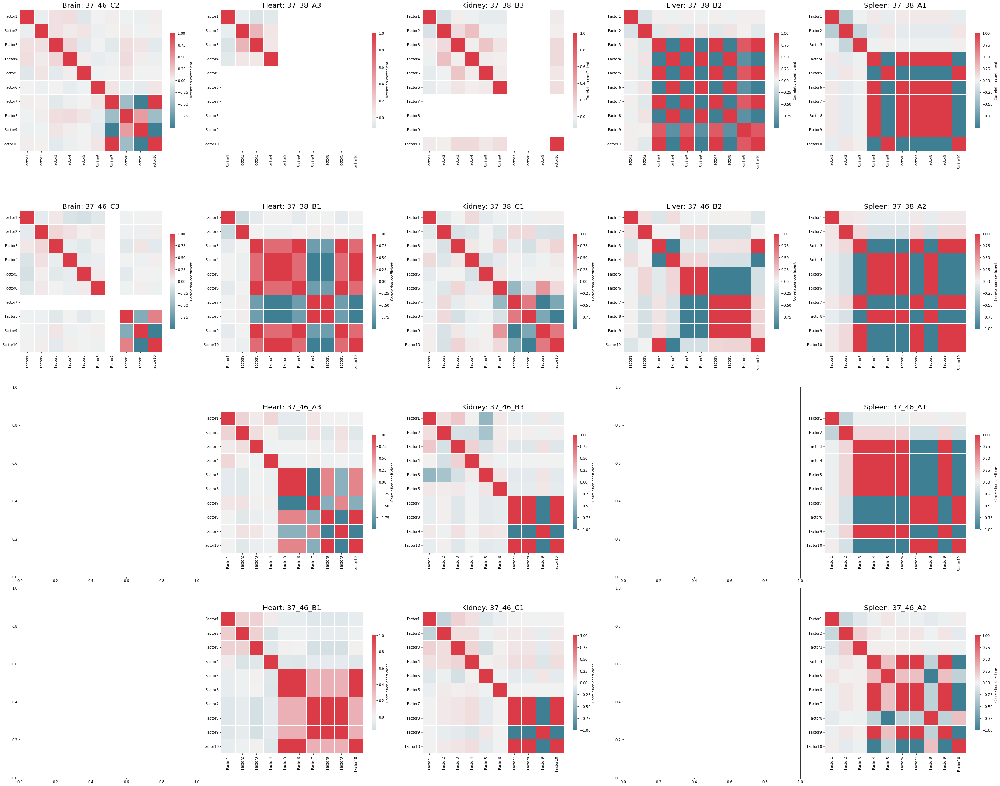

In [18]:
# get plotting parameters
organs = models.keys()
ncols = len(organs)
nrows = np.max([len(models[organ].keys()) for organ in models])

# create plot
fig, axs = plt.subplots(nrows, ncols, figsize=(8*ncols, 8*nrows))

for c, organ in enumerate(organs):
    # get indices for this organ
    indices = models[organ].keys()
    for r, idx in enumerate(indices):
        m = models[organ][idx]
        
        # plot
        mofax.plot_factors_correlation(m, ax=axs[r, c])
        
        # add titles
        axs[r,c].set_title("{}: {}".format(organ, idx), fontsize=20)
        
fig.tight_layout()
plt.show()

In [19]:
rdict = {}
for organ in sorted(models.keys()):
    mdict = {idx: m.get_r2().set_index('Factor')[["R2"]] for idx, m in models[organ].items()}
    rdict[organ] = pd.concat(mdict, axis=1).droplevel(1, axis=1)

In [20]:
expvar = pd.concat(rdict, axis=1).sort_index(level=0, ascending=False).drop(['Factor10', 'Factor9'], axis=0)

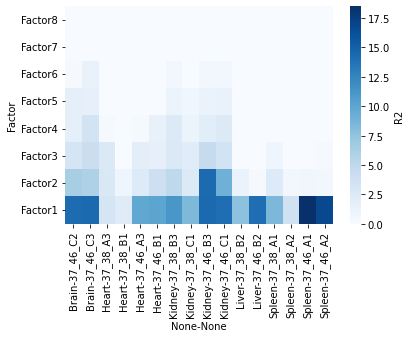

In [21]:
sns.heatmap(expvar, cmap="Blues", cbar_kws={"label": 'R2'})
#plt.savefig("figures/heatmap_var_explained.pdf")
plt.show()

In [22]:
pct_expvar = expvar.apply(lambda x: x / x.sum() * 100, axis=0)

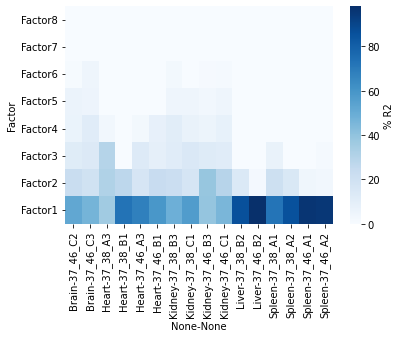

In [23]:
sns.heatmap(pct_expvar, cmap="Blues", cbar_kws={"label": '% R2'})
#plt.savefig("figures/heatmap_pctvar_explained.pdf")
plt.show()

## Plot first n factors of one example section

In [24]:
# select section per organ
orgsec_dict = {
    "Brain": "37_46_C3",
    "Heart": "37_38_A3",
    "Kidney": "37_46_B3",
    "Liver": "37_38_B2",
    "Spleen": "37_46_A1"
}

Saving figure to file figures/spatial_factors_Brain_37_46_C3_phalloidin.pdf
Saved.


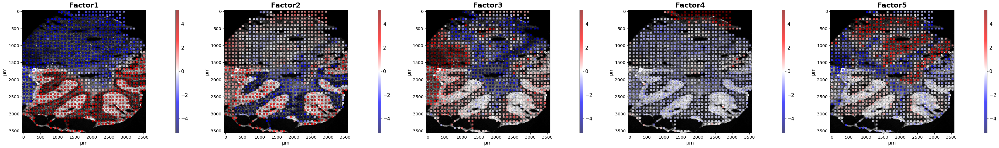

Saving figure to file figures/spatial_factors_Heart_37_38_A3_phalloidin.pdf
Saved.


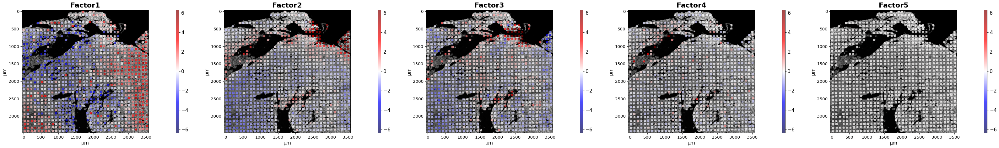

Saving figure to file figures/spatial_factors_Kidney_37_46_B3_phalloidin.pdf
Saved.


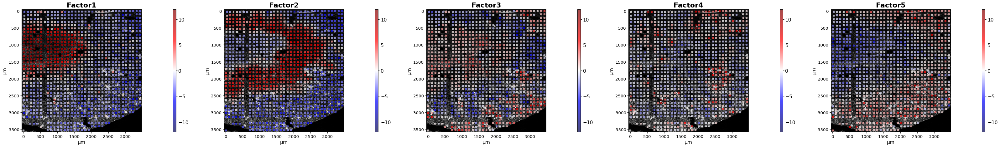

Saving figure to file figures/spatial_factors_Liver_37_38_B2_phalloidin.pdf
Saved.


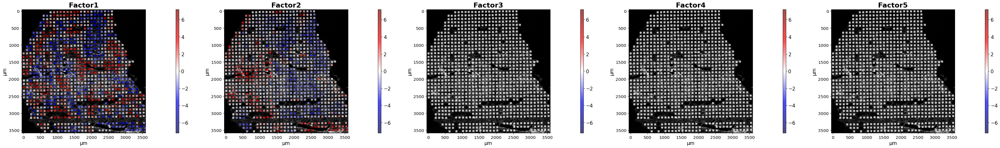

Saving figure to file figures/spatial_factors_Spleen_37_46_A1_phalloidin.pdf
Saved.


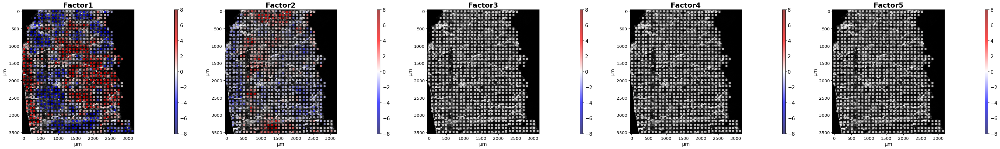

In [25]:
# parameters
groupby = "id"
n_factors = 5
image_key = "phalloidin"

# get organs sorted by alphabet
organs = sorted(orgsec_dict)
for organ in organs:
    idx = orgsec_dict[organ]
    
    # get model
    m = models[organ][idx]
    
    # get adata information
    adata = adatas[organ]
    a = db.tl.extract_groups(adata, groupby=groupby, groups=idx, extract_uns=True)

    # extract factor information and add to adata
    fact_df = m.get_factors(df=True)
    for col in fact_df.columns:
        a.obs[col] = fact_df[col]
        
    db.pl.spatial_single(a, keys=fact_df.columns[:n_factors], max_cols=n_factors, image_key=image_key,
                         cmap='seismic', cmap_center=0,
                         alpha=0.7,
                         save_only=False, savepath="figures/spatial_factors_{}_{}_{}.pdf".format(organ, idx, image_key))

## Explore further results on kidney sample

## Smoothness of factors

All of this factors seem to capture spatial patterns of variation that seems to vary smoothly along space to some extent. We can take a look at the smoothness score inferred by the model.

In [12]:
organ = "Kidney"
idx = "37_46_B3"

m = models[organ][idx]
adata = adatas[organ]

In [13]:
m

MOFA+ model: mofa model Kidney 37 46 B3
Samples (cells): 1115
Features: 2000
Groups: group1 (1115)
Views: rna (2000)
Factors: 10
Expectations: Sigma, W, Z

MEFISTO:
Covariates available: imagerow, imagecol

In [14]:
adata

AnnData object with n_obs × n_vars = 4103 × 15057
    obs: 'array_row', 'array_col', 'um_row', 'um_col', 'id', 'pixel_row', 'pixel_col', 'dapi_mean', 'experiment_id', 'age', 'organ', 'age_months', 'mouse_id', 'exp_date', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'CT010467.1_pct', 'leiden_uncorrected', 'leiden', 'leiden_coarse'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection', 'pct_cells_by_counts'
    uns: 'deg_leiden', 'deg_leiden_coarse', 'experiment_id_colors', 'hvg', 'id_colors', 'leiden', 'leiden_coarse_colors', 'leiden_colors', 'neighbors', 'neighbors_uncorrected', 'organ_colors', 'pca', 'sepal', 'spatial', 'spatialde', 'tsne', 'umap'
    obsm: 'X_emb', 'X_pca', 'X_scanorama', 'X_tsne', 'X_umap', 'spatial'
    varm: 'PCs'
    layers: 'counts', 'norm_counts'
    obsp: 'connecti

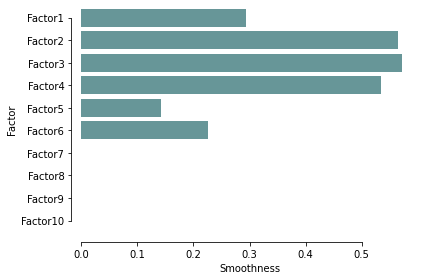

In [16]:
mofax.plot_smoothness(m)
plt.savefig("./figures/smoothness_kidney.pdf")
plt.show()

## Weights
### Get top features per Factor

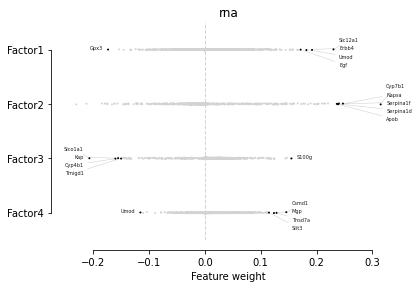

In [30]:
n_features = 5
n_factors  = 4

mofax.plot_weights(m, factors=list(range(4)), n_features=n_features)
plt.savefig("figures/factor_weights_factors{}_features{}.pdf".format(n_factors, n_features), bbox_inches="tight")
plt.show()

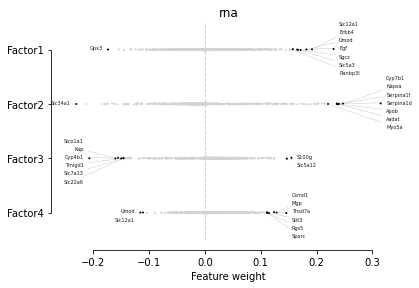

In [31]:
n_features = 8
n_factors  = 4

mofax.plot_weights(m, factors=list(range(4)), n_features=n_features)
plt.savefig("figures/factor_weights_factors{}_features{}.pdf".format(n_factors, n_features), bbox_inches="tight")
plt.show()

### Plot top features (absolute values)

Saving figure to file figures/spatial_top4_genes_positive_Factor1.pdf
Saved.


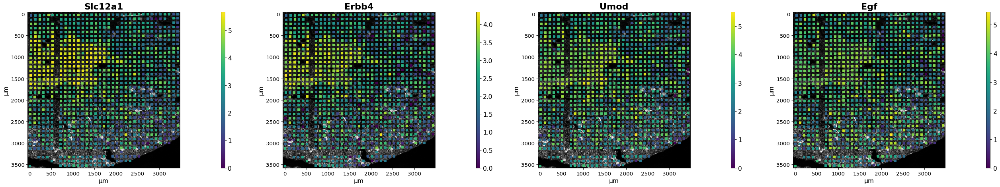

Saving figure to file figures/spatial_top4_genes_positive_Factor2.pdf
Saved.


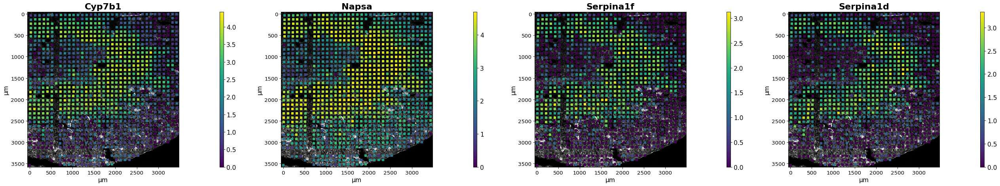

Saving figure to file figures/spatial_top4_genes_positive_Factor3.pdf
Saved.


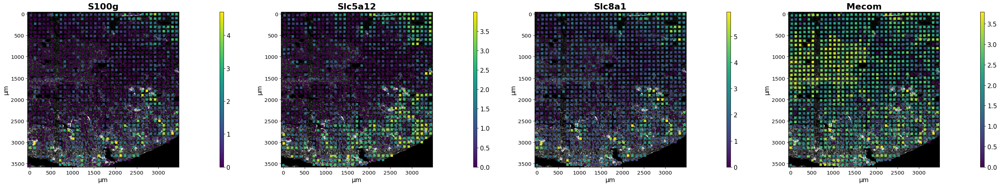

Saving figure to file figures/spatial_top4_genes_positive_Factor4.pdf
Saved.


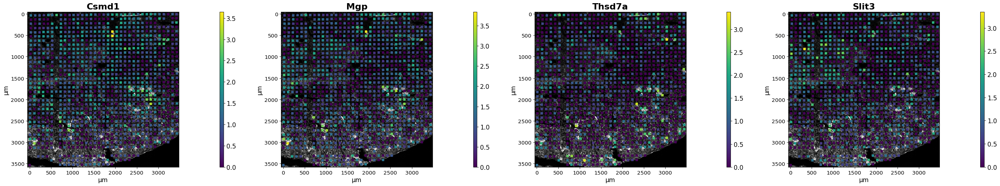

Saving figure to file figures/spatial_top4_genes_positive_Factor5.pdf
Saved.


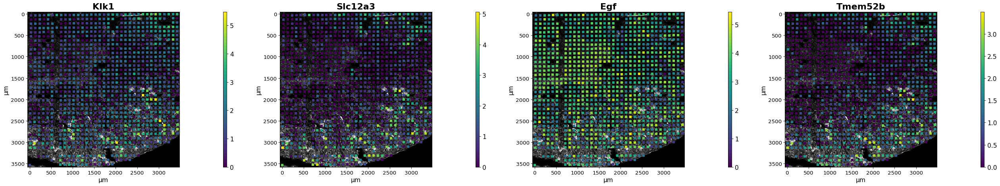

In [182]:
n_features = 4
for f in range(5):
    db.pl.spatial(adata, keys=m.get_top_features(factors=f, n_features=n_features, only_positive=True),
        image_key='phalloidin',
        groupby="id", groups=idx, savepath="figures/spatial_top{}_genes_positive_Factor{}.pdf".format(n_features, f+1))

### Plot top features (only positive values)

Saving figure to file figures/spatial_top4_genes_positive_Factor1.pdf
Saved.


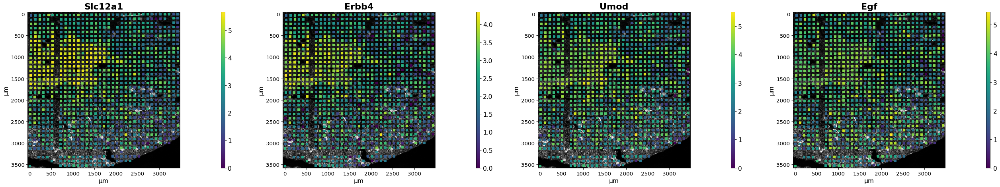

Saving figure to file figures/spatial_top4_genes_positive_Factor2.pdf
Saved.


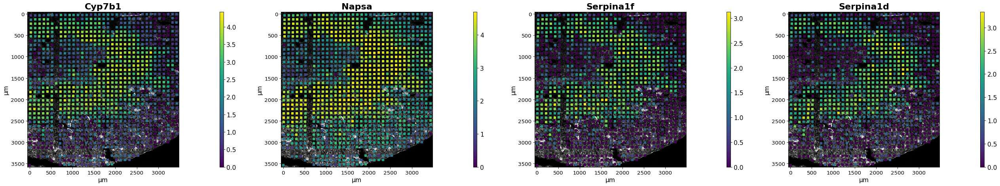

Saving figure to file figures/spatial_top4_genes_positive_Factor3.pdf
Saved.


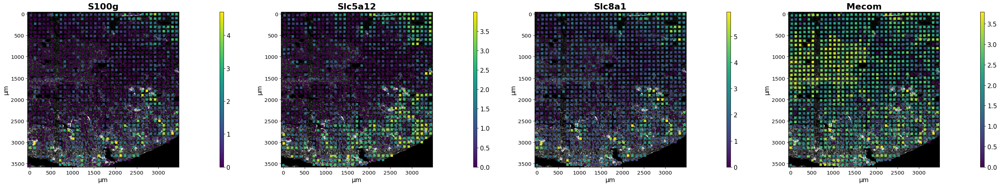

Saving figure to file figures/spatial_top4_genes_positive_Factor4.pdf
Saved.


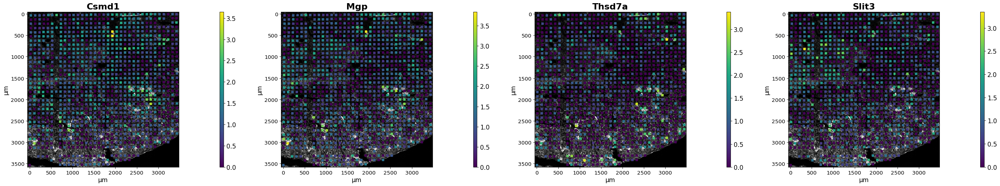

Saving figure to file figures/spatial_top4_genes_positive_Factor5.pdf
Saved.


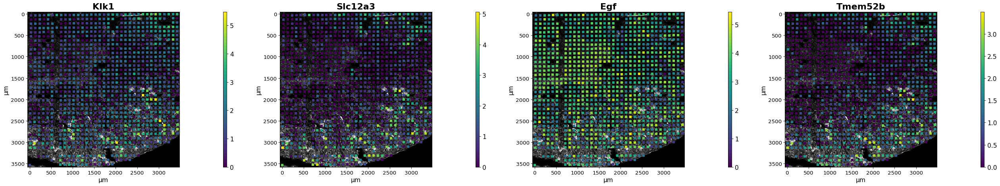

In [182]:
n_features = 4
for f in range(5):
    db.pl.spatial(adata, keys=m.get_top_features(factors=f, n_features=n_features, only_positive=True),
        image_key='phalloidin',
        groupby="id", groups=idx, savepath="figures/spatial_top{}_genes_positive_Factor{}.pdf".format(n_features, f+1))

# GO term analysis with top weighted genes per factor

## How to select top weighted genes?

Calculate 95 % confidence intervals of weights and select genes that are > 95% CI

In [18]:
from scipy import stats
from gprofiler import GProfiler

In [19]:
weights = pd.DataFrame(m.get_weights(), index=m.get_features()["feature"].values)

In [20]:
gos = {
    "gprofiler": {},
    "stringdb": {}
}

for i in weights.columns[:4]:
    # select weights for this factor
    w = weights[i]

    #create 95% confidence interval for weights
    cis = stats.norm.interval(alpha=0.95, loc=np.mean(w), scale=w.std())

    # select genes based on CI
    querygenes = list(w[w > cis[1]].index)

    # GO term analysis with StringDB
    sdb = db.tl.StringDB()
    e = sdb.call_stringdb_enrichment(genes=querygenes, species='mmusculus')

    # collect enrichment
    gos['stringdb']["Factor{}".format(i+1)] = e

    # GO term analysis with gprofiler
    gp = GProfiler(return_dataframe=True)
    e = gp.profile(organism='mmusculus', query=querygenes, no_evidences=False)
    # calc -log(p_value)
    e['Enrichment score'] = [-np.log10(elem) for elem in e.p_value]

    # collect enrichment
    gos['gprofiler']["Factor{}".format(i+1)] = e

for cat, e in gos.items():
    gos[cat] = pd.concat(e)

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:BP.pdf
Saved.


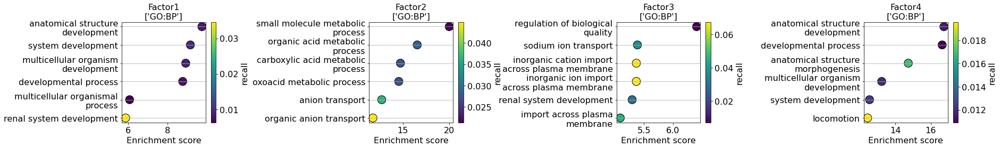

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:MF.pdf
Saved.


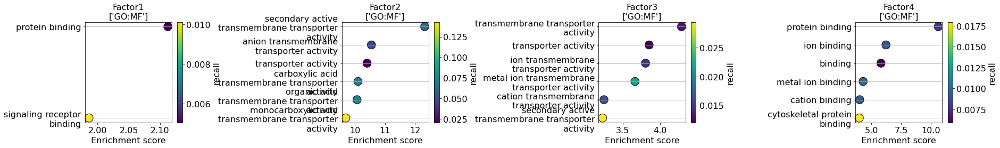

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_KEGG.pdf
Saved.


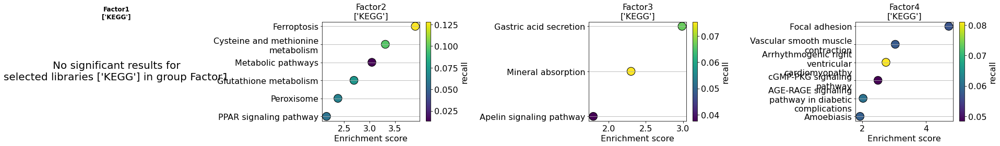

In [174]:
tool = "gprofiler"
libraries = ['GO:BP', 'GO:MF', 'KEGG']

for lib in libraries:
    db.pl.go_dotplot(gos[tool], libraries=lib, max_to_plot=6, color_key='recall', max_cols=4, figsize=(6.5,4),
        savepath="figures/go_dotplot_mefistofactors_{}_{}.pdf".format(tool, lib))

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:BP.pdf
Saved.


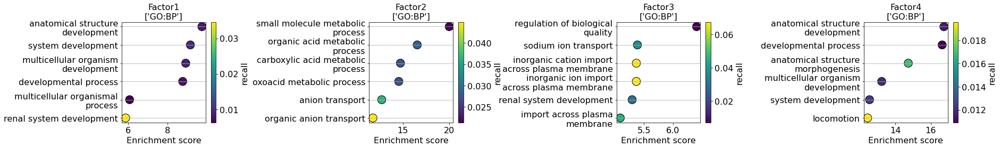

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_GO:MF.pdf
Saved.


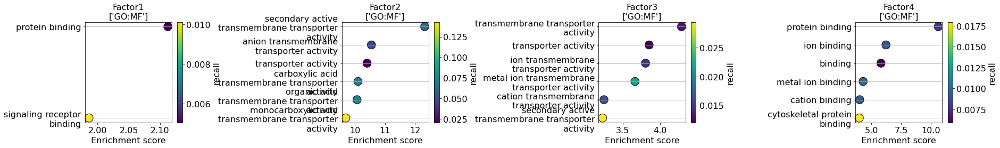

Saving figure to file figures/go_dotplot_mefistofactors_gprofiler_KEGG.pdf
Saved.


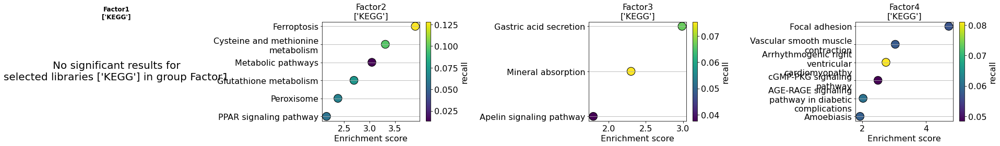

In [174]:
tool = "gprofiler"
libraries = ['GO:BP', 'GO:MF', 'KEGG']

for lib in libraries:
    db.pl.go_dotplot(gos[tool], libraries=lib, max_to_plot=6, color_key='recall', max_cols=4, figsize=(6.5,4),
        savepath="figures/go_dotplot_mefistofactors_{}_{}.pdf".format(tool, lib))

In [76]:
m.run_umap()

OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


UMAP coordinates added to the samples_metadata


In [77]:
m.samples_metadata

,group,UMAP1,UMAP2
sample,,,
14x3x37_46_C2,group1,10.821857,4.967648
14x2x37_46_C2,group1,11.727179,7.690771
14x1x37_46_C2,group1,10.924605,4.447344
12x15x37_46_C2,group1,9.110382,9.191647
12x14x37_46_C2,group1,9.031297,10.049961
...,...,...,...
18x27x37_46_C2,group1,2.609621,9.261757
18x22x37_46_C2,group1,0.327454,6.832309
18x21x37_46_C2,group1,-0.275322,5.413668


<AxesSubplot:xlabel='UMAP1', ylabel='UMAP2'>

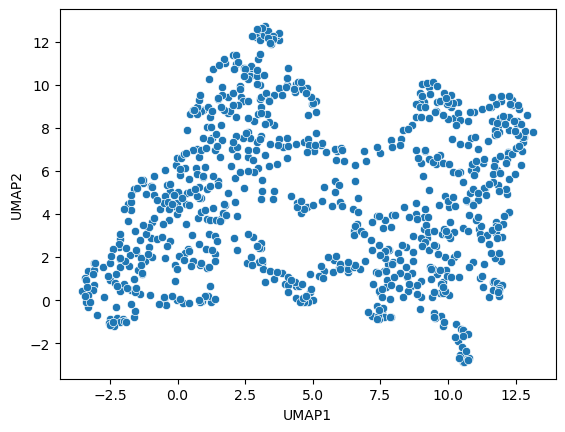

In [78]:
sns.scatterplot(data=m.samples_metadata, x="UMAP1", y="UMAP2")